In [14]:
#Librerías necesarias
import cv2
from matplotlib import pyplot as plt
import math


(341, 256, 3)
(341, 256, 3)
(341, 256, 3)
(341, 256, 3)
(341, 256, 3)
(341, 256, 3)


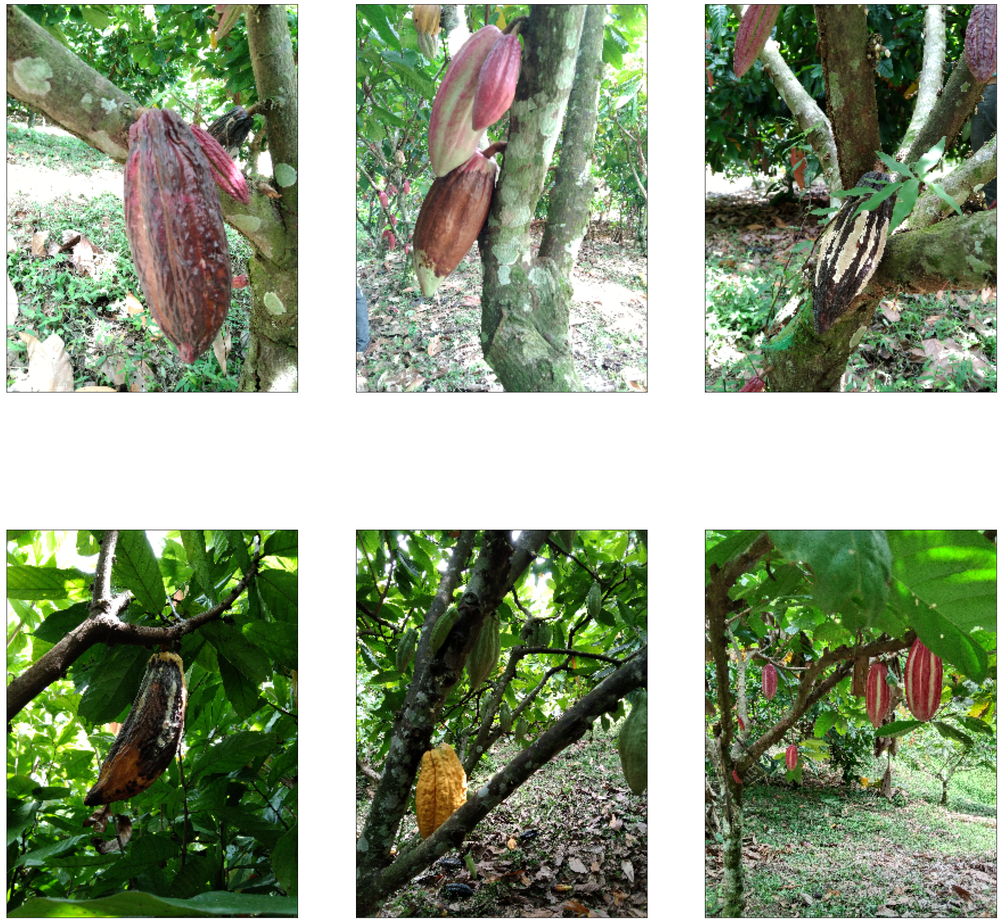

In [15]:
# Importacion de imagenes

# path
ruta='../../figs/imgsReto/'


# Importación de monilia
n_imag_monilia=2
imag_monilia=[]

for i in range(n_imag_monilia):
    imag_monilia_aux = cv2.imread(f'{ruta}Monilia/Monilia{i+1}.jpg')
    imag_monilia.append(cv2.cvtColor(imag_monilia_aux,cv2.COLOR_BGR2RGB))


# Importacion de Phytophthora 

n_imag_fito=2
imag_fito=[]

for i in range(n_imag_fito):
    imag_fito_aux = cv2.imread(f'{ruta}Fito/Fito{i+1}.jpg')
    imag_fito.append(cv2.cvtColor(imag_fito_aux,cv2.COLOR_BGR2RGB))
    

# Importación de cacao saludable

n_imag_healty=2
imag_healty=[]

favory_healty=range(n_imag_healty)

for i in favory_healty:
    imag_healty_aux = cv2.imread(f'{ruta}Sana/Sana{i+1}.jpg')
    imag_healty.append(cv2.cvtColor(imag_healty_aux,cv2.COLOR_BGR2RGB))
    
## Se unen todas las imágenes y se haca un redimensionamiento
imagenes = imag_fito+imag_monilia+imag_healty
minSize=256

## Redimensionamiento

for i in range(len(imagenes)):
    
    # Reducción de Escala

    n=imagenes[i].shape[0]
    m=imagenes[i].shape[1]
    

    escala= minSize/min(n,m)
    imagenes[i]= cv2.resize(imagenes[i], None, fx=escala, fy= escala,\
                                interpolation= cv2.INTER_LINEAR)
                      

plt.figure(figsize=(30, 30))
for i in range(len(imagenes)):
    print(imagenes[i].shape)
    plt.subplot(math.ceil(len(imagenes)/3),3,i+1),plt.imshow(imagenes[i])
    plt.xticks([]),plt.yticks([])

plt.show()


El procedimiento general para hacer la segmentación por medio de color se toma de [Maindola2021]

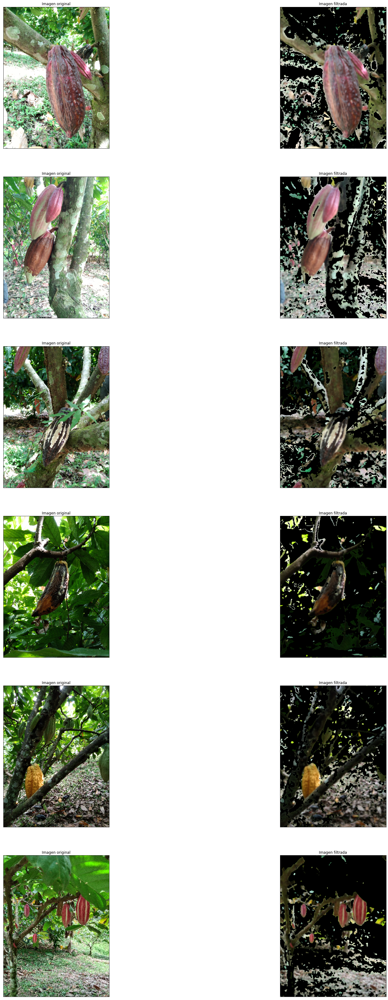

In [16]:
## Preprocesamiento

image_blur = []
image_colorFilter= []

# Rango de color para eliminar el verde
light_green = (40, 40, 40)
dark_green = (70, 255, 255)

# Rango de color para eliminar la luz [rrr2]

light_white = (0, 0, 231)
dark_white = (180, 18, 255)

for i in range(len(imagenes)):
    # Filtro GaussianBlur
    image_blur.append(cv2.GaussianBlur(imagenes[i],(5,5),0))
    
    # Filtrado en verde
    # conversion a HSV (matiz, saturación, valor)
    image_blur_HSV= cv2.cvtColor(image_blur[i], cv2.COLOR_RGB2HSV)
    mask = cv2.inRange(image_blur_HSV, light_green, dark_green)
    result = cv2.bitwise_and(image_blur[i], image_blur[i], mask=mask)
    resultadoSinVerde=cv2.subtract(image_blur[i],result)

    # Filtrado en blanco
    mask = cv2.inRange(image_blur_HSV, light_white, dark_white)
    result = cv2.bitwise_and(image_blur[i], image_blur[i], mask=mask)
    resultadoSinBlanco=cv2.subtract(resultadoSinVerde,result)

        

    image_colorFilter.append(resultadoSinBlanco)

plt.figure(figsize=(30,60))
contador=0
for i in range(0,len(imagenes)*2,2):
    plt.subplot(len(imagenes),2,i+1),plt.imshow(imagenes[contador])
    plt.title('Imagen original'),plt.xticks([]),plt.yticks([])

    plt.subplot(len(imagenes),2,i+2),plt.imshow(image_colorFilter[contador])
    plt.title('Imagen filtrada'),plt.xticks([]),plt.yticks([])

    contador+=1
contador=0
plt.show()

## Referencias

